# Ecuaciones diferenciales ordinarias: el método de Euler

Recordemos que una **ecuación diferencial ordinaria (EDO)** es (aproximadamente) una ecuación en la cual aparece una (o más) derivada(s) de una función, y para la cual queremos buscar la función que satisface esta relación.

La EDO más simple no-trivial y físicamente relevante en una variable es 

$$\dot{x} = -\alpha \, x. \qquad (*)$$

[Recordemos la notación $\dot{x} := \textstyle \frac{dx}{dt}$, donde $t$ es el tiempo; es muy común en la física que las EDOs involucren derivadas con respecto al tiempo.]

Una solución a esta ecuación es un objeto $x$, tal que cuando la derivamos con respecto al tiempo, nos arroja $-\alpha$ (una constante) multiplicada por el mismo objeto. Implícitamente está claro que $x$ depende de $t$, por lo que realmente $x$ se refiere a una función de $t$, es decir $x: \mathbb{R} \to \mathbb{R}$ es la función $t \mapsto x(t)$. 

Por lo tanto, la ecuación $\dot{x} = -\alpha x$ se puede considerar como una ecuación *funcional*, es decir, una igualdad entre funciones. 

Para entenderla, se reescribe de forma más explícita como sigue:

$$\dot{x}(t) = -\alpha x(t) \qquad \text{para cada } t \in \mathbb{R}.$$

Ahora es una igualdad de números, que dice que la "velocidad" en el tiempo $t$ es un cierto múltiplo de la posición en ese momento. De esta forma queda más claro (en mi opinión).

Esto quiere decir que si *de alguna manera* hayamos logrado saber que la solución en el tiempo $t$ está en la posición $x(t)$, entonces nos indica cuál será la *velocidad* $\dot{x}(t)$ en este momento. Esta es la información que necesitaremos para actualizar la solución al "siguiente momento en el tiempo" de forma numérica.

La forma general de una EDO en una variable es

$$\dot{x} = f(x, t),$$

o sea

$$\dot{x}(t) = f(x(t), t) \qquad \text{para cada } t \in \mathbb{R}.$$

Recordemos que debe ir acompañada por una condición inicial $x(t=t_0) = x_0$ para que constituya un problema bien posado (*problema de valores iniciales*, o *problema de Cauchy*).
La solución de una ecuación de este tipo será una *función* $x(t)$ que satisface al mismo tiempo que $\dot{x}(t) = f(x(t), t)$ para cada $t$, y que $x(t=t_0) = x_0$. 

En el caso particular de la ecuación $\dot{x} = -\alpha x$, conocemos analíticamente la solución, y nos servirá para comprobar nuestros métodos. Pero para las ecuaciones de interés para la física, esto *casi nunca ocurre*, una situación que ¡suele pasar desapercibida durante la carrera! En estos casos, debemos aplicar distintas técnicas de *aproximación* de la solución, entre las cuales se destacan los *métodos numéricos*.

# Método de Euler

Para resolver una EDO numéricamente en la computadora, tendremos que *aproximar* la solución continua $x: t \mapsto x(t)$ con una versión con una cantidad finita de información, es decir, *discretizarla* de alguna forma.

La manera más sencilla de hacerla es utilizando *diferencias finitas*. Empezaremos con el caso más sencillo, el llamado *método de Euler*.

#### Ejercicio 1

(i) ¿Cuál es la aproximación más sencilla de la derivada $\dot{x}(t)$, en términos de un tamaño de paso pequeño $h$?

(ii) Aplica esta aproximación con la ecuación $\dot{x} = f(x, t)$ para obtener una expresión para $x(t+h)$, es decir el valor *predicho* en el siguiente *paso* de tiempo, en términos del valor ya conocido $x(t)$.

(iii) Implementa un paso de este *método de Euler* en una función `paso_euler` para una función `f` cualquiera. ¿Cuáles argumentos debe tomar?

(iv) Ahora implementa el método de Euler completo en una función `euler`.
Para hacerlo, crea un arreglo `ts` de los tiempos en los cuales se evaluará la función. Luego crea otro arreglo de ceros, con la función `zeros`. [Si pasas el arreglo `t` como argumento a esta función, creará un arreglo del mismo tamaño al poner `zeros(size(t))`.] Ahora implementa el paso (ii) en un algoritmo iterativo para actualizar los valores en el nuevo arreglo para cada tiempo sucesivamente.

(v) Verifica que funcione tu método al aplicarlo a una función $f(t)$ sencilla que dependa *únicamente del tiempo*. [Recuerda que debes imponer una condición inicial.] ¿Cuál operación matemática acabas de llevar a cabo? Compara con la solución analítica.

In [1]:
using Plots
gr(fmt=:png)

Plots.GRBackend()

In [2]:
using Interact

┌ Info: Recompiling stale cache file /Users/luismartinezrojas/.julia/compiled/v0.7/Interact/XmYW4.ji for Interact [c601a237-2ae4-5e1e-952c-7a85b0c7eef1]
└ @ Base loading.jl:1185


HTML{String}("    <script id=\"webio-setup-15684697188294874441\">\n    // Immediately-invoked-function-expression to avoid global variables.\n    (function() {\n        var warning_div = document.getElementById(\"webio-warning-2870855359909625669\");\n        var hide = function () {\n            var script = document.getElementById(\"webio-setup-15684697188294874441\");\n            var parent = script && script.parentElement;\n            var grandparent = parent && parent.parentElement;\n            if (grandparent) {\n                grandparent.style.display = \"none\";\n            }\n            warning_div.style.display = \"none\";\n        };\n        if (window.require && require.defined) {\n            // Jupyter notebook.\n            if (require.defined(\"nbextensions/webio/main\")\n                    || require.defined(\"/assetserver/7ab08abe297ac5fe2f5e803af9a455b27a894ac8-dist/main.js\")) {\n                // Extension already loaded.\n                hide();\n                return;\n            }\n            console.warn(\"Loading WebIO Jupyter extension on an ad-hoc basis. Consider enabling the WebIO nbextension for a stabler experience (this should happen automatically when building WebIO).\");\n            require([\"/assetserver/7ab08abe297ac5fe2f5e803af9a455b27a894ac8-dist/main.js\"], function (webIOModule) {\n                webIOModule.load_ipython_extension();\n            });\n            warning_div.innerHTML = \"<strong>Loading WebIO Jupyter extension on an ad-hoc basis. Consider enabling the WebIO nbextension for a stabler experience (this should happen automatically when building WebIO).</strong>\";\n        } else if (window.location.pathname.includes(\"/lab\")) {\n            // Guessing JupyterLab\n            warning_div.innerHTML = \"WebIO does not support JupyterLab yet.\";\n        }\n    })();\n    </script>\n    <div\n        id=\"webio-warning-2870855359909625669\"\n        class=\"output_text output_stderr\"\n        style=\"padding: 1em; font-weight: bold;\"\n    >\n        Unable to load WebIO. Please make sure WebIO works for your Jupyter client.\n        <!-- TODO: link to installation docs. -->\n    </div>\n")

In [3]:
using SymPy

In [4]:
function paso_euler(f,x,t,h) 
    return     x+f(x,t)*h
end

paso_euler (generic function with 1 method)

In [5]:
g(x,t)=x+2*t
paso_euler(g)

MethodError: MethodError: no method matching paso_euler(::typeof(g))
Closest candidates are:
  paso_euler(::Any, !Matched::Any, !Matched::Any, !Matched::Any) at In[4]:2

In [6]:
Int64(floor(5.1))

5

In [7]:
function euler(f,x0,t0,tf,h)
    n=Int64(floor((tf-t0)/h))
    t=zeros(n)
    t[1]=t0
    for i in 2:n
       t[i]= t[i-1]+h
    end
    x=zeros(n)
    x[1]=x0
    for i in 2:n
        x[i]=paso_euler(f,x[i-1],t[i-1],h)
    end
    return x
end

euler (generic function with 1 method)

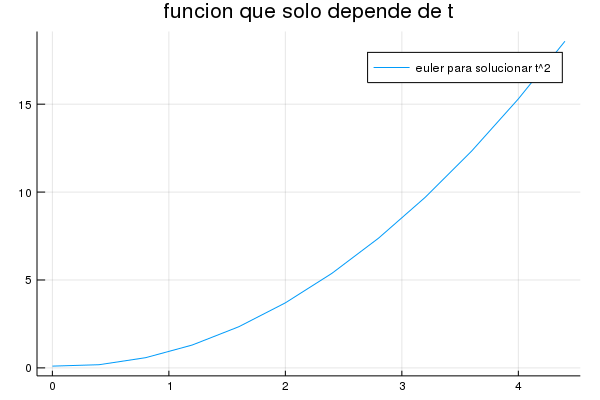

In [8]:
g(x,t)=2*t
tf=5
ti=0.1
h=0.4
ene=Int64(floor((tf-ti)/h))
s=euler(g,0.1,ti,tf,h)
x=zeros(ene)
x[1]=0
for i in 2:ene
    x[i]=x[i-1]+h
end
plot(x,s,label=("euler para solucionar t^2 "), title=("funcion que solo depende de t"))

In [9]:
x=Sym("x")

x

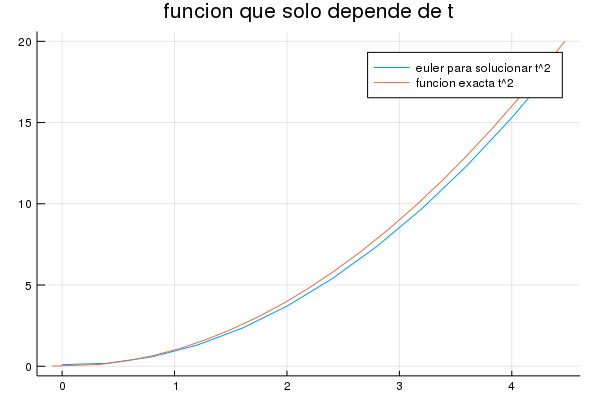

In [10]:
plot!(x->x^2, label=("funcion exacta t^2"))

#### Ejercicio 2

(i) Utiliza tu función `euler` para resolver la ecuación $\dot{x} = -\alpha x$,  y compara tu solución numérica gráficamente con la solución analítica de la ecuación. ¿Qué pasa al variar el paso de tiempo? Hazlo interactivo.


In [11]:
α=1
k=100
h1=0.01
 fu(x,t)=-α*x 
t0=0
x0=0.1

@manipulate for t in 1:10:k

 ta=Int64(floor((t-t0)/h1))
s1=euler(fu,x0,t0,t,h1)
x1=zeros(ta)
x1[1]=0
for i in 2:ta
    x1[i]=x1[i-1]+h1
end
    plot(x1,s1, label=("euler en el tiempo"))
end



(ii) Dado que el método de Euler utiliza una aproximación, el resultado no es exacto. Fija una $t$ final y calcula el error (desde la solución analítica) en función del tamaño de paso $h$. ¿Cómo es la convergencia en función de $h$?

In [12]:
function euler2(f,x0,t0,tf,n)
    h=abs(tf-t0)/n
    t=zeros(n)
    t[1]=t0
    for i in 2:n
       t[i]= t[i-1]+h
    end
    x=zeros(n)
    x[1]=x0
    for i in 2:n
        x[i]=paso_euler(f,x[i-1],t[i-1],h)
    end
    return t,x
end

euler2 (generic function with 1 method)

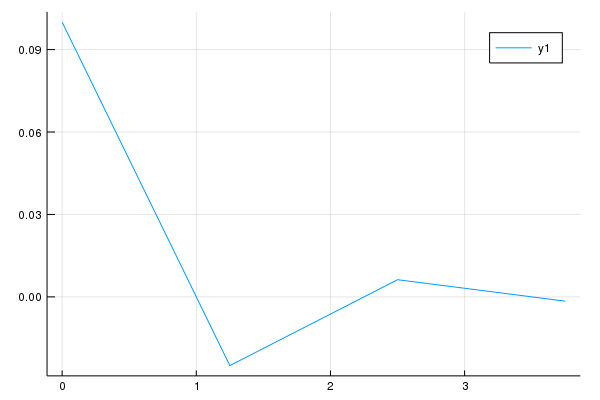

In [13]:
plot(euler2(fu,x0,t0,5,4))

In [14]:
p=plot(title=("Convergencia para distaintas h"))

tfinal=4
tinicial=0
xinicial=2
ln=[]
con=[]

for i in 10:20
    t,x=euler2(fu,xinicial,tinicial,tfinal,i)
    val=abs(x[end]-xinicial*exp(-α*t[end]))
    push!(ln,i)
    push!(con,val)
   p=plot!(t,x,label=("n=$i"))
end



┌ Warning: Deprecated syntax `implicit assignment to global variable `t``.
│ Use `global t` instead.
└ @ nothing none:0
┌ Warning: Deprecated syntax `implicit assignment to global variable `x``.
│ Use `global x` instead.
└ @ nothing none:0


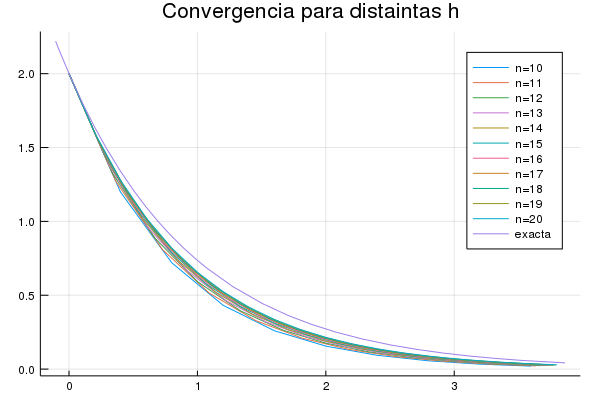

In [15]:
plot(p)
plot!(x->xinicial*exp(-α*x),label=("exacta"))

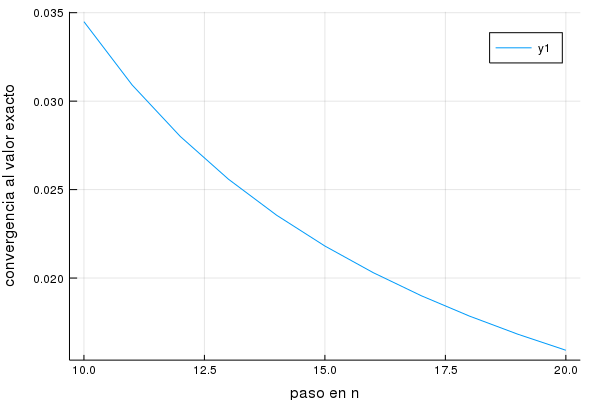

In [16]:
plot(ln,con,ylabel=("convergencia al valor exacto"), xlabel=("paso en n"))

#### Ejercicio 3

Considera la ecuación diferencial nolineal $\dot{x} = x \, (1-x)$, la cual modela la dinámica de una población; $x$ representa de alguna forma la densidad de población. 

(i) Dibuja el "campo vectorial" en el espacio $t$--$x$, es decir flechitas que indican en cuál dirección se camina en cada paso. 

[Pista: Utiliza la función `quiver`, con la sintaxis 

    quiver(xs, ys, vectorfield=(vxs, vys))
    
donde `xs` y `ys` son las coordenadas de las posiciones de las flechas, y `vxs` y `vys` las componentes de los vectores que dibujar.
]

In [17]:
xs=1:10
ts=1:10
tts = [t for t in ts for x in xs]
xxs = [x for t in ts for x in xs];

Add `using LinearAlgebra` to your imports.
  likely near /Users/luismartinezrojas/.julia/packages/IJulia/DL02A/src/kernel.jl:41
Add `using LinearAlgebra` to your imports.
  likely near /Users/luismartinezrojas/.julia/packages/IJulia/DL02A/src/kernel.jl:41
Add `using LinearAlgebra` to your imports.
  likely near /Users/luismartinezrojas/.julia/packages/IJulia/DL02A/src/kernel.jl:41
Add `using LinearAlgebra` to your imports.
  likely near /Users/luismartinezrojas/.julia/packages/IJulia/DL02A/src/kernel.jl:41
in dp at In[18]
Add `using LinearAlgebra` to your imports.
  likely near /Users/luismartinezrojas/.julia/packages/IJulia/DL02A/src/kernel.jl:41
Add `using LinearAlgebra` to your imports.
  likely near /Users/luismartinezrojas/.julia/packages/IJulia/DL02A/src/kernel.jl:41
Add `using LinearAlgebra` to your imports.
  likely near /Users/luismartinezrojas/.julia/packages/IJulia/DL02A/src/kernel.jl:41
Add `using LinearAlgebra` to your imports.
  likely near /Users/luismartinezrojas/.julia

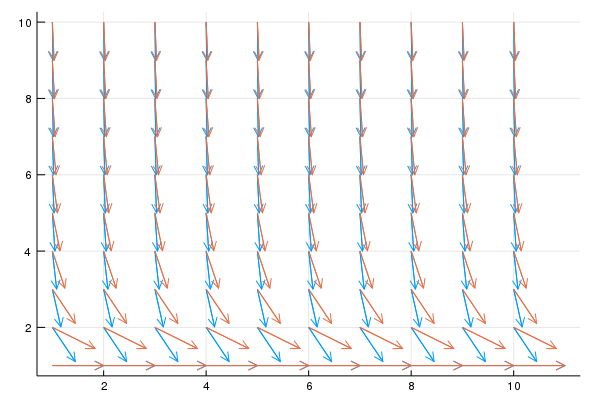

In [18]:
r(x, t) = x*(1-x)


dp(t, x) = normalize([1.0, r(x, t)])
dr(t, x) = normalize([3.0,r(x, t)])
quiver(tts,xxs,quiver=dp)
quiver!(tts,xxs,quiver=dr)

(ii) Resúelvela numéricamente desde distintas condiciones iniciales (incluso las no-físicas) y dibuja las soluciones correspondientes. Interpreta el resultado de manera física (o biológica). 

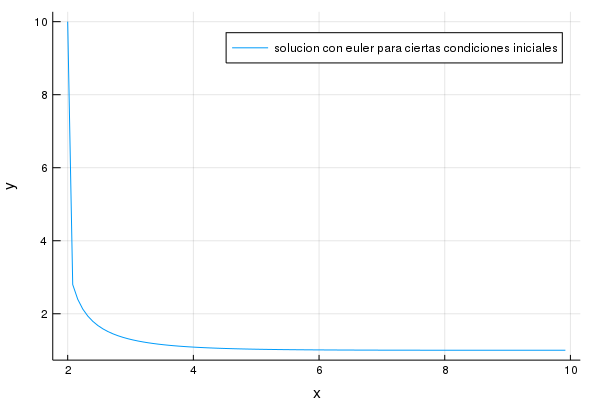

In [19]:
plot(euler2(r,10,2,10,100),label=("solucion con euler para ciertas condiciones iniciales"),
xlabel=("x"),ylabel=("y"))

## Varias variables

El método de Euler se extiende directamente a EDOs con más de una variable.

#### Ejercicio 4

(i) Escribe la ecuación diferencial que describe un oscilador armónico amortiguado.
$$
\frac{d^2\theta}{dt^2}=-\omega^2\theta -k \frac{d\theta}{dt}
$$
con $k=\alpha \omega$

(ii) Recuerda que hay un "truco" para reducir una ecuación diferencial de segundo orden a dos ecuaciones de primer orden; ¿cuál es? ¿Qué resulta en el caso del oscilador armónico amortiguado?

para reducir una EDO de segundo orden a un sistema de 2 EDO´s de primer grado se define primero
$$
u=\frac{dy}{dx}=:\frac{d\theta}{dt}
$$
tenemos así para el oscilador armonico amortiguado el siguiente sistema:
$$
\frac{du}{dt}=-\omega^2\theta-ku 
$$
$$
u=\frac{d\theta}{dt}
$$

(iii) Deriva un método de Euler para las ecuaciones acopladas

$$\dot{x} = f(x, y);$$
$$\dot{y} = g(x, y).$$

Para hacerlo, aplica la definición de la derivada de nuevo.

tenemos que
$$\dot{x_1} = f_1(x_1, x_2,t)$$
$$\dot{x_2} = f_2(x_1, x_2,t).$$
ahora si definimos 
$$\mathbf x=(x_1,x_2) \Rightarrow \dot{\mathbf x}=(\dot{x}_1,\dot{x}_2) $$
tomando tambien la definicion
$$\mathbf f=(f_1,f_2)$$
podemos obtener la ecuacion vectorial 
$$\dot{\mathbf x}=\mathbf f (\mathbf x)$$
De manera que para un sistema de dos variables, digamos $x,y$ tenemos que:
$$\dot{ x}\approx \frac{x(t+h)-x(t)}{h}\approx f(x,y,t)$$
y de manera analoga
$$\dot{ y}\approx \frac{y(t+h)-y(t)}{h} \approx g(x,y,t)$$
haciendo  la aproximacion, esto implica que
$$x(t+h)\approx hf(x,y;t)+x(t)$$
y de la misma forma
$$y(t+h)\approx hg(x,y;t)+y(t)$$ discretizando las diferencias tenemos la siguiente regra de recurrencia, definiendo $\mathbf x=(x,y)$
$$\dot{\mathbf x}[i+1]=h\mathbf f(x[i],y[i])+\mathbf x[i]$$

(iv) Implementa el método.

In [20]:
function eulerian(f,g,x0,y0,t0,tf,h)
     #h=abs(tf-t0)/n
    
    ts = t0:h:tf
    x = zeros(length(ts))
    y = zeros(length(ts))
    x[1] = x0
    y[1] = y0
    for i in 1:length(ts)-1
        x[i+1] = h * f(x[i], y[i]) + x[i]
        y[i+1] = h * g(x[i], y[i]) + y[i]
    end
    return ts, x, y
end 

eulerian (generic function with 1 method)

(v) Aplícalo al oscilador armónico amortiguado.
Calcula trayectorias desde distintas condiciones iniciales y dibújalas, y ¡hazlo interactivo!
Debes dibujar tanto $x(t)$ y $y(t)$ como funciones del tiempo, como el **espacio fase**.  Dibuja también el campo vectorial en el espacio fase.


ahora para seguir la notacion tomamos $\theta=x$ y $u=y$

In [21]:
#estamos fjando nuestras constantes α=a, ω=o
@manipulate for o in 1:5:70, a in 0.1:0.1:0.9,x0 in 1:5:50

f1(x, y) = y
g1(x, y) = (-2a * o * y) - (o^2 * x)
y0=0
h = 0.001
t0=0
t, x, y = eulerian(f1, g1, x0, y0, t0,t0+20,h)
plot(t, x, xlims=(t0,t0+5))
end

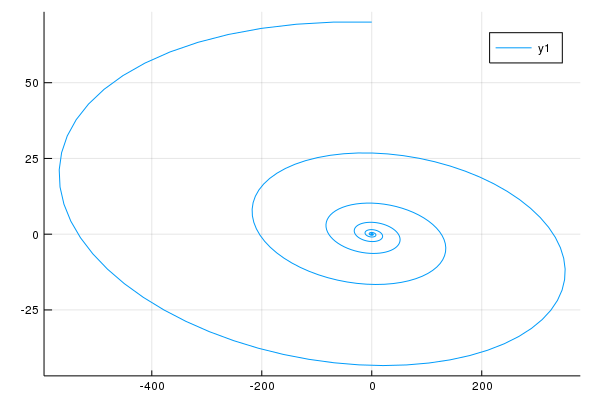

In [22]:
a=0.2
o=10
f1(x, y) = y
g1(x, y) = (-2a * o * y) - (o^2 * x)
x0=70
y0=0
h = 0.01
t0=0
t, x, y = eulerian(f1, g1, x0, y0, t0,t0+20,h)
plot(y,x)


## El enfoque vectorial

Recordemos que *cualquier* EDO, *incluídas las de orden superior* (es decir, con derivadas más altas que la primera de alguna función) se puede escribir de la siguiente manera, conteniendo únicamente primeras derivadas en el tiempo:

$$\dot{\mathbf{x}} = \mathbf{f}(\mathbf{x}, t),$$

es decir

$$\dot{\mathbf{x}}(t) = \mathbf{f}(\mathbf{x}(t), t),$$

donde ahora $\mathbf{x} = (x_1, \ldots, x_n) \in \mathbb{R}^n$ es un vector y $\mathbf{f}: \mathbb{R}^n \to \mathbb{R}^n$ es una función vectorial, que nos da un **campo vectorial** que indica en cuál dirección moverse desde cada punto del espacio.

#### Ejercicio 5

(i) Escribe una función para hacer un paso del método de Euler para las ecuaciones acopladas

$$\dot{\mathbf{x}} = \mathbf{f}(\mathbf{x}, t).$$

El código ahora deberá ser *genérico*, es decir, debe funcionar para cualquier función $\mathbf{f}$ y vector $\mathbf{x}$.


el codigo de paso ya ha sido escrito, ahora procedere a relizar el método en varias variable.

(ii) Escribe el método de Euler completo.

In [23]:
x5=[3,5,6]
e(x,t)=[x[1],-x[3],-2x[2]*t]
[e(x5,1)]

1-element Array{Array{Int64,1},1}:
 [3, -6, -10]

In [24]:
function eulersv(f,x0,t0,tf,h)
    #if(length(f(x0,1))==length(x0))
   
    t = t0:h:tf
    m=length(x0)
    n=length(t)
    x=zeros((n,m))
    x[1,:]=x0
    for i in 2:length(t)
            x[i,:]=paso_euler(f,x[i-1,:],t[i-1],h)#despues de tratar bastantes casos
                                  #me di cuenta que al mandar la funcion como vector y
                        # x como vector marca error  si se manda x como Int64 
        end
  
    return t,x
end

eulersv (generic function with 1 method)

(iii) Úsalo para resolver la caída libre y una caída con fricción lineal en la velocidad. Compara con el resultado exacto cuando puedes. Dibuja las resultados con distintos tamaños de fricción.


Sabemos que la caida libre es $F=\frac{d^2y}{dx^2}$, donde podemos considerar una fuerza cosntante debido a la separacion de nuestra posicion al centro de la tierra, como $g=9.81=cte \Rightarrow F=-mg$ pero para este caso tomemos $m=1$

Ahora como es una ecuacion de sgundo orden hay que descomponerlo en un sistema de dos ecuaciones:
$$u=\frac{dy}{dx} \rightarrow \frac{du}{dx}=\frac{d^2y}{dx^2}=F=-g(m=1)$$
y para el caso con friccion tenemos
$$u=\frac{dy}{dx} \rightarrow \frac{du}{dx}=\frac{d^2y}{dx^2}=F=-g+\frac{\beta}{m=1} v$$

In [25]:
cg= 9.81
func(x, t) = [x[2], -cg] #aqui se define la funcion como un vector , y se le indica que 
                   #x tambien debe ser una vector para poderse valuar
x0 = [30, 0]      #30 es la altura y 0 la condicion sobre u=0 i.e. inicia a vel=0
t0 = 0
h = 0.1
t, x = eulersv(func,x0,t0,5,h)

(0.0:0.1:5.0, [30.0 0.0; 30.0 -0.981; … ; -85.3656 -48.069; -90.1725 -49.05])

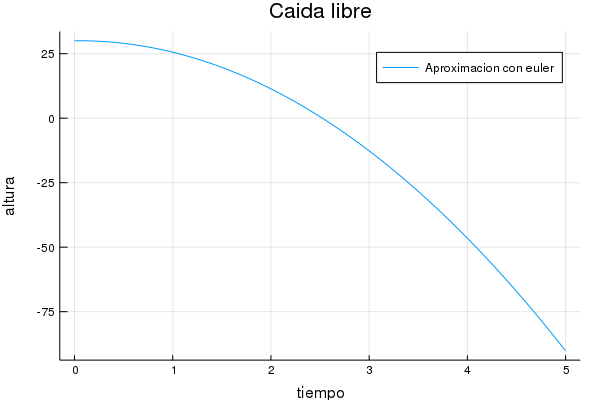

In [26]:
plot(t, x[:,1], label="Aproximacion con euler", title=("Caida libre"), ylabel=("altura"),xlabel=("tiempo"))

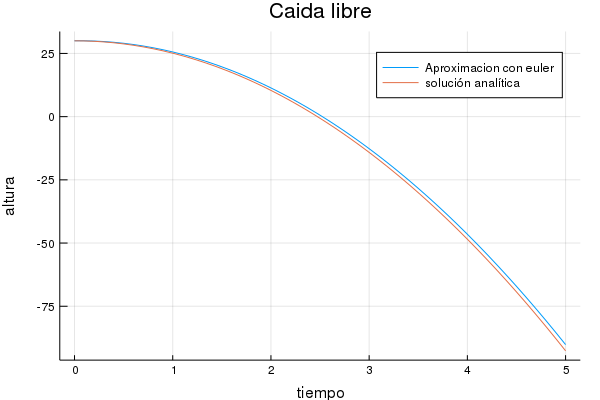

In [27]:
#ahora el resultado exacto de caida libre
cl(t, v0, y0) = -(9.81/2)t^2 + v0*t + y0
exacta = cl.(t, 0, 30)
plot!(t, exacta, label=("solución analítica"), title=("Caida libre"), ylabel=("altura"),xlabel=("tiempo"))
#se tomó h=0.1 más inexacta para ver la diferencia

┌ Warning: Deprecated syntax `implicit assignment to global variable `t``.
│ Use `global t` instead.
└ @ nothing none:0
┌ Warning: Deprecated syntax `implicit assignment to global variable `x``.
│ Use `global x` instead.
└ @ nothing none:0


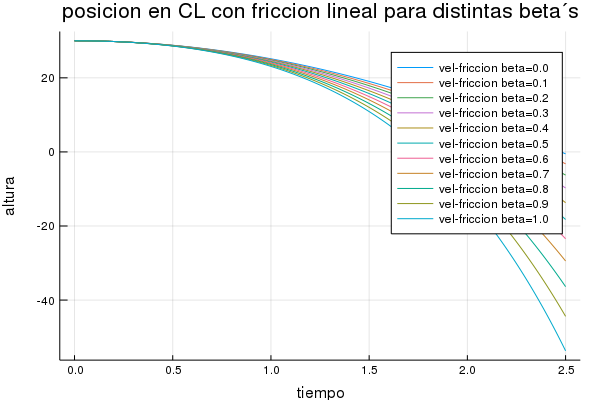

In [28]:
#caso con friccion lineal en la velocidad, es como en el caso del oscilador armonico
#dando en caso de las siguientes ecuaciones

cg=9.81
x0 = [30, 0]      #30 es la altura y 0 la condicion sobre u=0 i.e. inicia a vel=0
t0 = 0
h = 0.01

m=1
ply=plot(title=("posicion en CL con friccion lineal para distintas beta´s"),ylabel=("altura"),xlabel=("tiempo"))
for i in 0:0.1:1
fric_lin(x, t) = [x[2], -cg+(i/m)*x[2]]#pues x[2]=u es la velocidad
    t,x=eulersv(fric_lin,x0,t0,2.5,h)
     ply=plot!(t,x[:,1],label=("vel-friccion beta=$i"))
    
    end
plot(ply)



(iv) Resuelve la caída libre con fricción cuadrática en la velocidad.

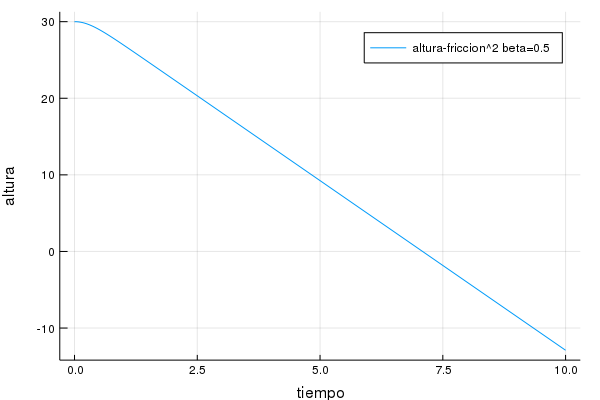

In [29]:
cg=9.81
x0 = [30, 0]      #30 es la altura y 0 la condicion sobre u=0 i.e. inicia a vel=0
t0 = 0
h = 0.01
β=0.5
m=1
fric_lin(x, t) = [x[2], -cg+(β/m)*x[2]*x[2]]#pues x[2]=u es la velocidad
    
    t,x=eulersv(fric_lin,x0,t0,10,h)
     plot(t,x[:,1],label=("altura-friccion^2 beta=$β"),ylabel=("altura"),xlabel=("tiempo"))

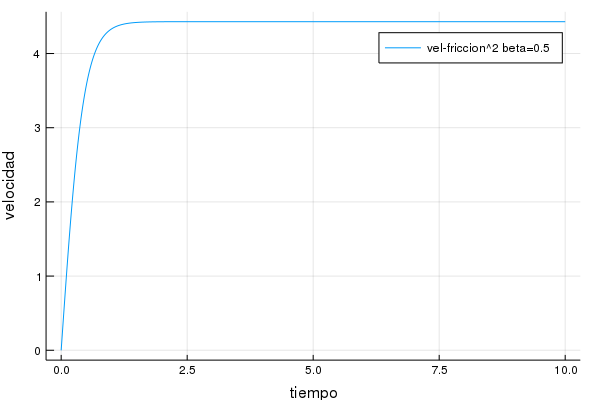

In [30]:
 plot(t,abs.(x[:,2]),label=("vel-friccion^2 beta=$β"),ylabel=("velocidad"),xlabel=("tiempo"))

#### Ejercicio 6

(i) Resuelve numéricamente el problema del tiro parabólico con Euler para un proyectil que empieza en una altura $h>0$ con rapidez $1$ y ángulo inicial $\alpha$, *hasta que* caiga al suelo. [Pista: ¿Cómo puedes implementar esta condición en tu código? Haz una nueva función si sea necesario.]

sabemos que cuando se soluciona ese problema en mecanica vectorialse se resuelven $x$ y $y$ de manera independiente por lo que tenemos que para x las ecuaciones de moviemiento serán
$$\frac{dx}{dt}=v_x $$ y analogamente tenemos que
$$\frac{dv_x}{dt}=0$$ pues no hay fuerza externa que altenere nuestro movimiento en $x$, y el sistema para la variable $y$ tnemos que:
$$\frac{dy}{dt}=v_y $$ 
$$\frac{dv_y}{dt}=-g$$ 
con condiciones iniciales obvias como $x(0)=0$ y $y(0)=h$ y para las velocidades $$v_{x0}=V0cos(\theta)$$
$$v_{y0}y=V0sin(\theta)$$

In [31]:
G=9.81
v0=13
θ=80
haltura=55
h=0.1
tf=5
t0=0
tiro_parax(x,t)=[x[2],0]
tiro_paray(y,t)=[y[2],-G]
x0 = [0, v0*cosd(θ)]
y0 = [haltura, v0*sind(θ)]
t1,x1=eulersv(tiro_parax,x0,t0,tf,h)
t2,y1=eulersv(tiro_paray,y0,t0,tf,h)

(0.0:0.1:5.0, [55.0 12.8025; 56.2803 11.8215; … ; 2.36665 -35.2665; -1.16 -36.2475])

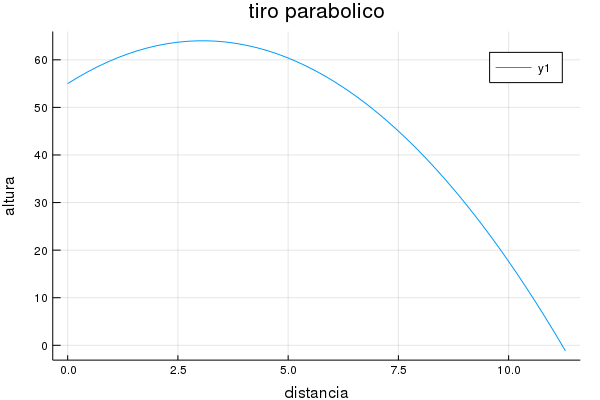

In [32]:
plot(x1[:,1],y1[:,1],title=("tiro parabolico"),xlabel=("distancia"),ylabel=("altura"))

(ii) Encuentra la distancia horizontal donde cae al suelo (el *rango*). Dibuja el resultado tal que puedas manipular interactivamente las condiciones iniciales. Encuentra numéricamente el ángulo que maximiza el rango. ¿Es correcto?

In [33]:
function rango(x)
    piso=[]
for i in 1:length(x)
    if (x[i]>=0)
        push!(piso,x[i])
    end
end
    return piso
end


rango (generic function with 1 method)

In [34]:
rang=rango(y1[:,1])

dist=x1[length(rang),1]#distancia sobre el piso
dist1=Float32(dist)
dist1

11.061389f0

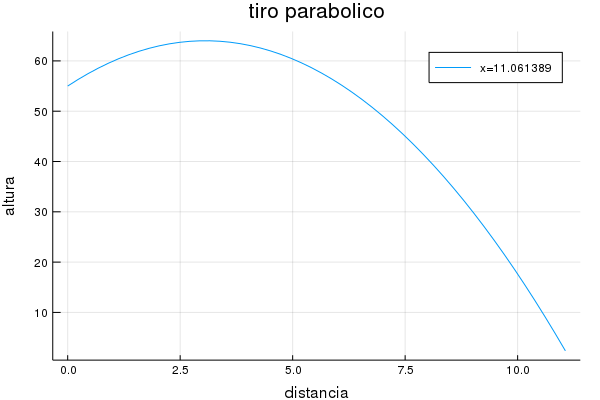

In [35]:
plot([x1[i,1] for i in 1:length(rang)],rang,title=("tiro parabolico"),xlabel=("distancia"),ylabel=("altura"),
    label=(" x=$dist1"))

In [36]:
ache=0.001
tf=100
@manipulate for θ in 20:70,v0 in 20:5:80
    
x0 = [0, v0*cosd(θ)]
y0 = [haltura, v0*sind(θ)]
t1,x1=eulersv(tiro_parax,x0,t0,tf,ache)
t2,y1=eulersv(tiro_paray,y0,t0,tf,ache)
    rang=rango(y1[:,1])
    dist=Float32(x1[length(rang),1])#distancia sobre el piso
plot([x1[i,1] for i in 1:length(rang)],rang,title=("tiro parabolico"),xlabel=("distancia"),ylabel=("altura"),
    label=(" x=$dist"))
end

In [37]:
#maximizar angulo
function max_ang_tp(tiro_parax,tiro_paray,v0,haltura)
distx=[]
ai=20
for θ in ai:70
t0=0
tf=100
ache=0.01
x0 = [0, v0*cosd(θ)]
y0 = [haltura, v0*sind(θ)]
t1,x1=eulersv(tiro_parax,x0,t0,tf,ache)
t2,y1=eulersv(tiro_paray,y0,t0,tf,ache)
    rang=rango(y1[:,1])
    dist=x1[length(rang),1]#distancia sobre el piso
    push!(distx,dist)
end
indice=0
for i in 1:length(distx)
    
    if(maximum(distx)-distx[i])!=0
        continue
        else
        indice=i+ai
    end
end
return indice
end

max_ang_tp (generic function with 1 method)

In [38]:
tiro_parax(x,t)=[x[2],0]
tiro_paray(y,t)=[y[2],-G]
max_ang_tp(tiro_parax,tiro_paray,50,55)

40

esto nos dice que para $v_0=50$ el ángulo que maximiza la distancia recorrida en $x$ es de $\theta=40^o$

(iii) Agrega fricción del aire al problema y agrégalo como otro parámetro que puedas manipular. ¿Cómo cambia el resultado de la pregunta (ii)?

ahora agregando friccion del aire al igual que en la pregunta anterior lo aregaremos para que dependa de manera lineal de la velocidad


                
                
La resistancia la aire se presentara de manera lineal $-\eta v$ modificando asi las ecuaciones :
$$\frac{dx}{dt}=v_x $$ y analogamente tenendremos que
$$\frac{dv_x}{dt}=-\eta v_x$$ pues ahora hay fuerza externa que altenere nuestro movimiento en $x$, y el sistema para la variable $y$ tnemos que:
$$\frac{dy}{dt}=v_y $$ 
$$\frac{dv_y}{dt}=-g-\eta v_y$$ 
con condiciones iniciales dadas por $x(0)=0$ y $y(0)=h$ y para las velocidades $$v_{x0}=V0cos(\theta)$$
$$v_{y0}=V0sin(\theta)$$
con $v_x, v_y$ las proyecciones de la velocidad

In [39]:
ache=0.001
tf=100
G=9.8
haltura=60
@manipulate for θ in 20:70,v0 in 20:5:80,η in 0:0.1:1
tiro_pfx(x,t)=[x[2],-η*x[2]]
tiro_pfy(y,t)=[y[2],-G-η*y[2]]    
x0 = [0, v0*cosd(θ)]
y0 = [haltura, v0*sind(θ)]
t1,x1=eulersv(tiro_pfx,x0,t0,tf,ache)
t2,y1=eulersv(tiro_pfy,y0,t0,tf,ache)
    rang=rango(y1[:,1])
    dist=Float32(x1[length(rang),1])#distancia sobre el piso
plot([x1[i,1] for i in 1:length(rang)],rang,title=("tiro parabolico con friccion lineal"),xlabel=("distancia"),ylabel=("altura"),
    label=(" x=$dist"))
end

In [40]:
η=0.4
tiro_pfx(x,t)=[x[2],-η*x[2]]
tiro_pfy(y,t)=[y[2],-G-η*y[2]]
max_ang_tp(tiro_pfx,tiro_pfy,50,60)

21

y haciendo uso del maipulate se confirma que efectivamente la aprox. numerica nos indica que  distancia maxima recorida para $v_0=50$ y para una altura $h=60$ es de $\theta=21^o$ 

#### Ejercicio 7

En el caso del oscilador armónico, podemos hacer mucho de forma analítica. Pero no siempre es el caso:

(i) Escribe la ecuación diferencial ordinaria que modela un péndulo simple amortiguado.

La ecuación de newton para un pendulo simple es muy similar a la del oscilador armonico alvoque esta no esta linealizada y esta dada por :
$$ml\ddot{\theta}=-mg\sin(\theta)-2ml\dot{\theta}\sqrt\frac{g}{l}$$
simplificando y tomando $\omega^2=\frac{g}{l}$ se tiene que:
$$\ddot{\theta}=-\omega^2 \sin(\theta)-2\omega\dot{\theta}$$

(ii) Dibuja el campo vectorial y encuentra distintas trayectorias.

Add `using LinearAlgebra` to your imports.
  likely near /Users/luismartinezrojas/.julia/packages/IJulia/DL02A/src/kernel.jl:41
Add `using LinearAlgebra` to your imports.
  likely near /Users/luismartinezrojas/.julia/packages/IJulia/DL02A/src/kernel.jl:41
Add `using LinearAlgebra` to your imports.
  likely near /Users/luismartinezrojas/.julia/packages/IJulia/DL02A/src/kernel.jl:41
Add `using LinearAlgebra` to your imports.
  likely near /Users/luismartinezrojas/.julia/packages/IJulia/DL02A/src/kernel.jl:41
Add `using LinearAlgebra` to your imports.
  likely near /Users/luismartinezrojas/.julia/packages/IJulia/DL02A/src/kernel.jl:41
Add `using LinearAlgebra` to your imports.
  likely near /Users/luismartinezrojas/.julia/packages/IJulia/DL02A/src/kernel.jl:41
Add `using LinearAlgebra` to your imports.
  likely near /Users/luismartinezrojas/.julia/packages/IJulia/DL02A/src/kernel.jl:41
Add `using LinearAlgebra` to your imports.
  likely near /Users/luismartinezrojas/.julia/packages/IJulia

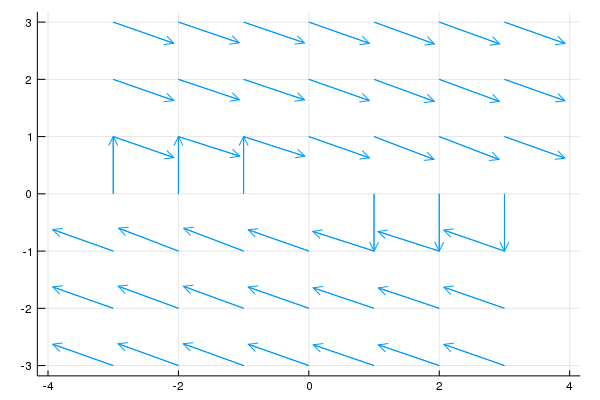

In [48]:
xs1=-5:3
ys=-3:3
yys = [y for y in ys for x in xs1]
xx1s = [x for y in ys for x in xs1]
ω=0.2
u(x,y) =y
v(x,y)=-sin(x)*ω^2-2*ω*y
using LinearAlgebra
dp(x,y) = normalize([u(x, y),v(x,y)])

quiver(yys,xx1s,quiver=dp)


(iii) ¿Los resultados coinciden con la intuición física?

pues en el centro se muestra un punto de equilibrio y en las orillas indica movimiento hacia los extremos.